In [36]:
# !pip install anomalib
# !pip install matplotlib
# !pip install numpy
# !pip install tensorboard
# !pip install torch==2.7.1 torchvision==0.22.1 torchaudio==2.7.1 --index-url https://download.pytorch.org/whl/cu128
# !pip install kaggle

In [37]:
# 2. Импорт необходимых модулей
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
from sklearn.model_selection import train_test_split

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.optim as optim
import torch.nn.functional as torch_f

from anomalib.models.image.supersimplenet.loss import SSNLoss
from anomalib.models.image.supersimplenet.torch_model import SupersimplenetModel

# import warnings
# warnings.filterwarnings('ignore')

# Сборка датасетов

Для предобработки картинок и постобработке карт аномалий

In [38]:
dataset_path = os.path.join("datasets", "MVTecAD")
class_name = "hazelnut"
test_groups = ["crack", "cut", "hole", "good"]
image_size = 256

In [39]:
def get_augmented_transformer(image_size):
    return transforms.Compose([
        # transforms.Resize((image_size, image_size)),
        transforms.RandomResizedCrop((image_size, image_size), scale=(0.9, 1.1), ratio=(1, 1)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomRotation(degrees=10),
        transforms.ColorJitter(brightness=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

def get_transformer(image_size):
    return transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

def get_mask_transformer(image_size):
    return transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor()
    ])

def show_tensor(tensor):
    pil_img = transforms.ToPILImage()
    pil_img(tensor).show()


def postprocess_anomaly_map(anomaly_map, true_img_size):
    ndims = anomaly_map.ndim
    while anomaly_map.ndim < 4:
        anomaly_map = anomaly_map.unsqueeze(0)

    upsampled_mask = torch_f.interpolate(
        anomaly_map,
        size=true_img_size,
        mode='bilinear',
        align_corners=False
    )
    
    return upsampled_mask.squeeze()

In [40]:
# path = os.path.join(dataset_path, class_name, "test", test_groups[0], "003.png")
# print(path)
# img = Image.open(path).convert('RGB')
# img = get_transformer(256)(img)
# print(img.shape)
# # img = img[0, :, :]
# img = postprocess_anomaly_map(img.unsqueeze(0), true_img_size=(900, 900))
# print(img.shape)
# print(img.max())
# print(img.dtype)
# show_tensor(img)

Датасеты

In [41]:
class Train_Dataset(Dataset):
    def __init__(self, root_dir, category, transform=None, split='train', good_class_dir="good"):
        self.root_dir = os.path.join(root_dir, category, split)
        self.transform = transform
        self.image_paths = []
        
        for class_name in os.listdir(self.root_dir):
            if class_name == good_class_dir:
                class_path = os.path.join(self.root_dir, class_name)
                if os.path.isdir(class_path):
                    for img_name in os.listdir(class_path):
                        if img_name.endswith(('.png', '.jpg', '.jpeg')):
                            self.image_paths.append(os.path.join(class_path, img_name))
        
        # print(f"Loaded {len(self.image_paths)} images from {split} set")
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image
    

class Segmentation_Dataset(Dataset):
    def __init__(self, root_dir, category, img_transform=None, mask_transform=None, imgs_dir="test", test_classes = [], masks_dir="ground_truth", good_class_dir="good"):
        self.img_transform = img_transform
        self.mask_transform = mask_transform
        self.base_transform = transforms.Compose([transforms.ToTensor()])

        imgs_path = os.path.join(root_dir, category, imgs_dir)
        image_paths = []
        for class_name in os.listdir(imgs_path):
            if len(test_classes) > 0 and not (class_name in test_classes):
                continue
            if class_name != good_class_dir:
                class_path = os.path.join(imgs_path, class_name)
                if os.path.isdir(class_path):
                    for img_name in os.listdir(class_path):
                        if img_name.endswith(('.png', '.jpg', '.jpeg')):
                            image_paths.append(os.path.join(class_path, img_name))
        
        masks_path = os.path.join(root_dir, category, masks_dir)
        mask_paths = []
        for class_name in os.listdir(masks_path):
            if len(test_classes) > 0 and not (class_name in test_classes):
                continue
            if class_name != good_class_dir:
                class_path = os.path.join(masks_path, class_name)
                if os.path.isdir(class_path):
                    for mask_name in os.listdir(class_path):
                        if mask_name.endswith(('.png', '.jpg', '.jpeg')):
                            mask_paths.append(os.path.join(class_path, mask_name))
        
        self.images = sorted(image_paths)
        self.masks = sorted(mask_paths)

        # print(f"Loaded {len(self.images)} images and masks for segmentation task")
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        image = Image.open(self.images[idx]).convert('RGB')
        mask = Image.open(self.masks[idx]).convert('L')

        image = self.img_transform(image) if self.img_transform else self.base_transform(image)
        mask = self.mask_transform(mask) if self.mask_transform else self.base_transform(mask)
        
        return (image, mask)
    


class Classification_Dataset(Dataset):
    def __init__(self, root_dir, category, img_transform=None, imgs_dir="test", test_classes = [], good_class_dir="good"):
        self.img_transform = img_transform
        self.base_transform = transforms.Compose([transforms.ToTensor()])

        imgs_path = os.path.join(root_dir, category, imgs_dir)
        image_paths = []
        image_labels = []
        for class_name in os.listdir(imgs_path):
            if len(test_classes) > 0 and not (class_name in test_classes):
                continue
            class_path = os.path.join(imgs_path, class_name)
            if os.path.isdir(class_path):
                for img_name in os.listdir(class_path):
                    if img_name.endswith(('.png', '.jpg', '.jpeg')):
                        image_paths.append(os.path.join(class_path, img_name))
                        if class_name != good_class_dir:
                            image_labels.append(1)
                        else:
                            image_labels.append(0)

        self.images = image_paths
        self.labels = image_labels
                        
        # print(f"Loaded {len(self.images)} images with labels for classification")
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        image = Image.open(self.images[idx]).convert('RGB')
        label = self.labels[idx]

        image = self.img_transform(image) if self.img_transform else self.base_transform(image)
        
        return (image, label)

In [42]:
# train_dataset = Train_Dataset(dataset_path, class_name, get_augmented_transformer(256))
train_dataset = Train_Dataset(dataset_path, class_name, transform=get_transformer(image_size))
print(f"Train dataset size: {len(train_dataset)}")

segmentation_dataset = Segmentation_Dataset(dataset_path, class_name, img_transform=get_transformer(image_size), mask_transform=get_mask_transformer(image_size), test_classes=test_groups)
segmentation_val_dataset, segmentation_test_dataset = train_test_split(segmentation_dataset, test_size=0.5, random_state=42, shuffle=True)
print(f"Segmentation dataset size: validation - {len(segmentation_val_dataset)}, test - {len(segmentation_test_dataset)}")

classification_dataset = Classification_Dataset(dataset_path, class_name, img_transform=get_transformer(image_size), test_classes=test_groups)
classification_val_dataset, classification_test_dataset = train_test_split(classification_dataset, stratify=[i[1] for i in classification_dataset], test_size=0.5, random_state=42, shuffle=True)
print(f"Classification dataset size: validation - {len(classification_val_dataset)}, test - {len(classification_test_dataset)}")

Train dataset size: 391
Segmentation dataset size: validation - 26, test - 27
Classification dataset size: validation - 46, test - 47


# Метрики качества

In [43]:
import numpy as np
from sklearn.metrics import average_precision_score, roc_auc_score, roc_auc_score
import cv2
import matplotlib.pyplot as plt
from skimage import measure

def img2mask(img):
    mask = img if img.ndim <= 2 else img.squeeze()
    if mask.ndim == 3:
        mask = mask[0, :, :]
    if mask.ndim != 2:
        print("Wrong dimensions")
        raise ValueError
    return mask

def pixel_avg_precision(pred_anomaly_map, true_mask):
    pred_anomaly_map = img2mask(pred_anomaly_map)
    true_mask = img2mask(true_mask)

    y_true = (true_mask.flatten().cpu().numpy() > 0.5).astype(int)
    y_scores = pred_anomaly_map.flatten().cpu().numpy()

    if y_scores.max() > 1.0 or y_scores.min() < 0.0:
        print(f"predicted masks scores are not from [0, 1]")
        raise ValueError

    ap = average_precision_score(y_true, y_scores)
    return ap if not np.isnan(ap) else 0.0


def pixel_roc_auc(pred_anomaly_map, true_mask):
    pred_anomaly_map = img2mask(pred_anomaly_map)
    true_mask = img2mask(true_mask)

    y_true = (true_mask.flatten().cpu().numpy() > 0.5).astype(int)
    y_scores = pred_anomaly_map.flatten().cpu().numpy()

    if y_scores.max() > 1.0 or y_scores.min() < 0.0:
        print(f"predicted masks scores are not from [0, 1]")
        raise ValueError

    auc = roc_auc_score(y_true, y_scores)
    return auc if not np.isnan(auc) else 0.5


def predict_label(pred_anomaly_map, k=0.001):
    """Возвращает скор картинки по среднему k наибольших пикселей"""
    pred_anomaly_map = img2mask(pred_anomaly_map)

    y_scores = pred_anomaly_map.flatten().cpu()
    top_k_scores = torch.topk(y_scores, int(k * len(y_scores)))

    return torch.mean(top_k_scores.values)


def plot_training_curves(metrics: list, metric_names: list, log_dir: str, plot_name: str, log_y=False):
    os.makedirs(log_dir, exist_ok=True)

    plt.figure(figsize=(10, 6))
    for metric, metric_name in zip(metrics, metric_names):
        plt.plot(metric, label=metric_name, marker='o')
    plt.xlabel('Epoch')
    plt.ylabel('Metric')
    if log_y:
        plt.yscale('log')
    plt.title(f'Training and Validation {metric_name}')
    plt.legend()
    plt.grid(True)
    plt.savefig(os.path.join(log_dir, plot_name))
    plt.show()


def visualize_results(original_image, anomaly_map, true_mask=None, score=None, figsize=(15, 5), alpha=0.7, cmap='jet'):
    denormalize = transforms.Compose([
        transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225], std=[1/0.229, 1/0.224, 1/0.225])
    ])
    original_image = denormalize(original_image)
    
    original_image = postprocess_anomaly_map(original_image, true_img_size=(original_image.shape[-2], original_image.shape[-1]))
    original_image = original_image if original_image.ndim <= 3 else original_image.squeeze()
    if not true_mask is None:
        true_mask = true_mask if true_mask.ndim <= 3 else true_mask.squeeze()
    anomaly_map = anomaly_map if anomaly_map.ndim <= 3 else anomaly_map.squeeze()

    to_pil = transforms.ToPILImage()
    if isinstance(original_image, torch.Tensor):
        original_image = to_pil(original_image)

    fig, axes = plt.subplots(1, 3, figsize=figsize)
    
    # Оригинальное изображение
    axes[0].imshow(original_image)
    axes[0].set_title('Original image', fontsize=14)
    axes[0].axis('off')
    
    # Маска
    if not (true_mask is None):
        true_mask = true_mask if true_mask.ndim <= 3 else true_mask.squeeze()
        true_mask = img2mask(true_mask)
        if isinstance(true_mask, torch.Tensor):
            true_mask = true_mask.cpu().numpy()
        axes[1].imshow(original_image)
        heatmap = axes[1].imshow(true_mask, cmap=cmap, alpha=alpha)
        axes[1].set_title('Input + True Mask', fontsize=14)
        axes[1].axis('off')
        plt.colorbar(heatmap, ax=axes[1], fraction=0.046, pad=0.04)


    # Карта аномалий
    anomaly_map = img2mask(anomaly_map)
    if isinstance(anomaly_map, torch.Tensor):
        anomaly_map = anomaly_map.squeeze().cpu().numpy()

    axes[2].imshow(original_image)
    heatmap = axes[2].imshow(anomaly_map, cmap=cmap, alpha=alpha)
    axes[2].set_title('Input + Anomaly Map', fontsize=14)
    axes[2].axis('off')
    plt.colorbar(heatmap, ax=axes[2], fraction=0.046, pad=0.04)
    
    plt.tight_layout()
    plt.show()

# Обучение модели

In [44]:
device="cuda" if torch.cuda.is_available() else "cpu"
print(device)
if torch.cuda.is_available():
    print(f"Название GPU: {torch.cuda.get_device_name(torch.cuda.current_device())}")
else:
    print("CUDA недоступна, обучение будет выполняться на CPU")

cuda
Название GPU: NVIDIA GeForce RTX 3070 Ti Laptop GPU


In [45]:
# Функция для заморозки весов экстрактора фичей
def freeze_feature_extractor(model):
    """Замораживает веса предобученного экстрактора фичей"""
    # Находим экстрактор фичей в модели (обычно это backbone)
    frozen_params_num = 0
    if hasattr(model, 'feature_extractor'):
        for param in model.feature_extractor.parameters():
            param.requires_grad = False
            frozen_params_num += param.numel()
    print(f"Parameters frozen: {frozen_params_num}")

# Функция для получения обучаемых параметров
def get_trainable_parameters(model):
    """Возвращает список обучаемых параметров"""
    trainable_params = []
    train_params_num = 0
    for name, param in model.named_parameters():
        if param.requires_grad:
            trainable_params.append(param)
            train_params_num += param.numel()
    print(f"Trainable parameters: {train_params_num}")
    return trainable_params

In [46]:
val_good_len = 0
with torch.no_grad():
    for i in tqdm(range(len(classification_test_dataset)), desc="Classification Val", leave=False):
        img, true_label = classification_test_dataset[i]
        if true_label:
            continue
        val_good_len += 1

print(val_good_len)

20


In [ ]:
import copy
import torch
import torch.nn as nn
from torch.optim import Adam, AdamW
from tqdm import tqdm
import os
from torch.optim.lr_scheduler import MultiStepLR
from torch.optim.lr_scheduler import LinearLR, CosineAnnealingLR, SequentialLR

def train_ssn_with_validation(
    model,
    train_dataset,
    segmentation_dataset=None,
    classification_dataset=None,
    num_epochs=10,
    learning_rate=1e-3,
    weight_decay=1e-3,
    device=device,
    log_interval=1,
    log_dir="../experiments",
    freeze_extractor=True,
    batch_size=8,
    num_workers=0,
    resume_from_checkpoint=True,
    early_stopping_patience=5,
    early_stopping_metric="Pixels_ROC_AUC",
    early_stopping_mode="max"
):
    model = model.to(device)
    criterion = SSNLoss()

    def forward_training_loss_path(images, masks, labels):
        features = model.feature_extractor(images)
        adapted = model.adaptor(features)
        target_mask = model.downsample_mask(masks, *features.shape[-2:])
        target_label = labels.to(torch.float32)
        train_features, target_mask, target_label = model.anomaly_generator(adapted, target_mask, target_label)
        pred_map, pred_score = model.segdec(train_features)
        return pred_map, pred_score, target_mask, target_label
    os.makedirs(log_dir, exist_ok=True)
    checkpoints_dir = os.path.join(log_dir, "middle_logs")
    os.makedirs(checkpoints_dir, exist_ok=True)

    total_params = sum(p.numel() for p in model.parameters())
    print(f"Total parameters number: {total_params}")
    if freeze_extractor:
        freeze_feature_extractor(model)
    trainable_params = get_trainable_parameters(model)
    optimizer = optim.AdamW(
        [
            {
                "params": model.adaptor.parameters(),
                "lr": learning_rate,
            },
            {
                "params": model.segdec.parameters(),
                "lr": learning_rate * 2,
                "weight_decay": weight_decay,
            },
        ]
    )

    dataloader = DataLoader(
        dataset=train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers
    )

    scheduler = MultiStepLR(
        optimizer,
        milestones=[max(1, int(num_epochs * 0.8)), max(1, int(num_epochs * 0.9))],
        gamma=0.4
    )

    best_score = -float('inf') if early_stopping_mode == "max" else float('inf')
    epochs_without_improvement = 0
    best_model_state = None

    checkpoint_path = os.path.join(checkpoints_dir, "checkpoint.pth")
    start_epoch = 0
    epoch_scores = {"Train_Loss": []}
    if resume_from_checkpoint and os.path.exists(checkpoint_path):
        print(f"Loading checkpoint from {checkpoint_path}...")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        model.load_state_dict(checkpoint["model_state_dict"])
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
        if "scheduler_state_dict" in checkpoint:
            scheduler.load_state_dict(checkpoint["scheduler_state_dict"])
        start_epoch = checkpoint["epoch"]
        epoch_scores = checkpoint["epoch_scores"]
        print(f"Resuming from epoch {start_epoch + 1}")
    else:
        print("Starting training from scratch...")

    for epoch in range(start_epoch, num_epochs):
        model.train()
        total_loss = 0.0
        for batch in tqdm(dataloader, desc=f"Train Epoch {epoch+1}/{num_epochs}", leave=False):
            if isinstance(batch, (list, tuple)):
                images = batch[0]
            else:
                images = batch
            images = images.to(device)

            optimizer.zero_grad()
            with torch.set_grad_enabled(True):
                dummy_masks = torch.zeros((images.shape[0], images.shape[-2], images.shape[-1]), device=device)
                dummy_labels = torch.zeros((images.shape[0],), device=device)
                pred_map, pred_score, target_mask, target_label = model(images, masks=dummy_masks, labels=dummy_labels)
                loss = criterion(pred_map=pred_map, pred_score=pred_score, target_mask=target_mask, target_label=target_label)

                loss.backward()
                optimizer.step()

            total_loss += loss.item()

        avg_loss = total_loss / len(dataloader)
        scheduler.step()
        if (epoch + 1) % log_interval == 0:
            print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {avg_loss:.6f}")

        epoch_scores["Train_Loss"].append(avg_loss)

        model.eval()
        with torch.no_grad():
            # Валидация функции потерь
            if classification_dataset is not None:
                if not ("Validation_Loss" in epoch_scores):
                    epoch_scores["Validation_Loss"] = []

                total_loss = 0
                good_val_len = 0
                for i in tqdm(range(len(classification_dataset)), desc="Classification Val", leave=False):
                    img, true_label = classification_dataset[i]
                    if true_label:
                        continue
                    img = img.unsqueeze(0).to(device)
                    val_masks = torch.zeros((img.shape[0], img.shape[-2], img.shape[-1]), device=device)
                    val_labels = torch.zeros((img.shape[0],), device=device)
                    pred_map, pred_score, target_mask, target_label = forward_training_loss_path(img, val_masks, val_labels)
                    loss = criterion(pred_map=pred_map, pred_score=pred_score, target_mask=target_mask, target_label=target_label)
                    total_loss += loss.item()
                    good_val_len += 1

                avg_loss = total_loss / max(1, good_val_len)
                if (epoch + 1) % log_interval == 0:
                    print(f"Epoch {epoch+1}/{num_epochs} | Val Loss: {avg_loss:.6f}")

                epoch_scores["Validation_Loss"].append(avg_loss)


            # Валидация сегментации
            if segmentation_dataset is not None:
                if not ("Avg_Precision" in epoch_scores):
                    epoch_scores["Avg_Precision"] = []
                if not ("Pixels_ROC_AUC" in epoch_scores):
                    epoch_scores["Pixels_ROC_AUC"] = []

                precision_scores = []
                roc_auc_scores = []
                
                for i in tqdm(range(len(segmentation_dataset)), desc="Segmentation Val", leave=False):
                    img, true_mask = segmentation_dataset[i]
                    img = img.unsqueeze(0).to(device)

                    output = model(img)
                    anomaly_map = postprocess_anomaly_map(torch.sigmoid(output.anomaly_map), true_img_size=(true_mask.shape[-2], true_mask.shape[-1]))

                    img_precision = pixel_avg_precision(anomaly_map, true_mask)
                    precision_scores.append(img_precision)

                    img_roc_auc = pixel_roc_auc(anomaly_map, true_mask)
                    roc_auc_scores.append(img_roc_auc)

                avg_precision_score = torch.tensor(precision_scores).mean().item()
                avg_roc_auc_score = torch.tensor(roc_auc_scores).mean().item()
                if (epoch + 1) % log_interval == 0:
                    print(f"Epoch {epoch+1} | Segmentation avg precision score: {avg_precision_score:.4f}")
                    print(f"Epoch {epoch+1} | Segmentation avg roc auc score: {avg_roc_auc_score:.4f}")

                epoch_scores["Avg_Precision"].append(avg_precision_score)
                epoch_scores["Pixels_ROC_AUC"].append(avg_roc_auc_score)

            # Валидация классификации
            if classification_dataset is not None:
                if not ("Classification_ROC_AUC" in epoch_scores):
                    epoch_scores["Classification_ROC_AUC"] = []

                predicted_scores = []
                true_labels = []
                
                for i in tqdm(range(len(classification_dataset)), desc="Classification Val", leave=False):
                    img, true_label = classification_dataset[i]
                    img = img.unsqueeze(0).to(device)

                    output = model(img)
                    img_score = output.pred_score.item()

                    predicted_scores.append(img_score)
                    true_labels.append(true_label)

                cls_score = roc_auc_score(true_labels, predicted_scores)
                if (epoch + 1) % log_interval == 0:
                    print(f"Epoch {epoch+1} | Classification roc auc score: {cls_score:.4f}")

                epoch_scores["Classification_ROC_AUC"].append(cls_score)


        if (epoch + 1) % log_interval == 0:
            torch.save({
                "epoch": epoch + 1,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                "epoch_scores": epoch_scores,
                "learning_rate": learning_rate,
            }, checkpoint_path)

            checkpoint_metrics_path = os.path.join(checkpoints_dir, "checkpoints_metrics.txt")
            if not os.path.exists(checkpoint_metrics_path) or (not resume_from_checkpoint and epoch == 0):
                with open(checkpoint_metrics_path, "w") as f:
                    f.write(f"Epocha {epoch + 1}:\n")
                    for metric_name, metric in epoch_scores.items():
                        f.write(f"{metric_name}: {metric[-1]}\n")
                    f.write("\n")
            else:
                with open(checkpoint_metrics_path, "a") as f:
                    f.write(f"Epocha {epoch + 1}:\n")
                    for metric_name, metric in epoch_scores.items():
                        f.write(f"{metric_name}: {metric[-1]}\n")
                    f.write("\n")

        # ---------- Early Stopping ----------
        should_stop = False
        if early_stopping_metric in epoch_scores:
            current_score = epoch_scores[early_stopping_metric][-1]

            # Проверяем, улучшилась ли метрика
            is_better = (
                (early_stopping_mode == "max" and current_score > best_score) or
                (early_stopping_mode == "min" and current_score < best_score)
            )

            if is_better:
                best_score = current_score
                epochs_without_improvement = 0
                best_model_state = copy.deepcopy(model.state_dict())  # сохраняем лучшую модель
            else:
                epochs_without_improvement += 1

            if epochs_without_improvement >= early_stopping_patience:
                print(f"Early stopping triggered at epoch {epoch + 1}")
                should_stop = True

        if should_stop:
            break

    # ---------- Сохранение модели и логов ----------
    # Загружаем лучшую модель (если была)
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print(f"Loaded best model (score: {best_score:.4f})")
    else:
        print("No early stopping metric found — using final model")

    torch.save(model.state_dict(), os.path.join(log_dir, "trained_model_weights.pth"))
    torch.save(model, os.path.join(log_dir, "trained_model.pth"))
    print(f"Model saved to {log_dir}")

    with open(os.path.join(log_dir, "final_metrics.txt"), "w") as f:
        for metric_name, metric in epoch_scores.items():
            f.write(f"{metric_name}: {metric[-1]}\n")

    plot_training_curves([epoch_scores["Train_Loss"], epoch_scores["Validation_Loss"]], ["Train_Loss", "Validation_Loss"], log_dir, "Losses.png")
    del epoch_scores["Train_Loss"]
    del epoch_scores["Validation_Loss"]
    plot_training_curves([metric for metric in epoch_scores.values()], [metric_name for metric_name in epoch_scores.keys()], log_dir, "validation_metrics.png")

    return model


In [48]:
torch.cuda.empty_cache()

In [57]:
logs_path = "v3_new_scheduler"

Total parameters number: 33719363
Parameters frozen: 24862528
Trainable parameters: 8856835
Starting training from scratch...


Epoch 4/70 | Train Loss: 1.040322


Epoch 4/70 | Val Loss: 0.999348


Epoch 4 | Segmentation avg precision score: 0.5683
Epoch 4 | Segmentation avg roc auc score: 0.9420


Epoch 4 | Classification roc auc score: 0.6942


Epoch 8/70 | Train Loss: 0.977856


Epoch 8/70 | Val Loss: 0.863257


Epoch 8 | Segmentation avg precision score: 0.4615
Epoch 8 | Segmentation avg roc auc score: 0.8933


Epoch 8 | Classification roc auc score: 0.6865


Epoch 12/70 | Train Loss: 0.888921


Epoch 12/70 | Val Loss: 0.746878


Epoch 12 | Segmentation avg precision score: 0.5527
Epoch 12 | Segmentation avg roc auc score: 0.9260


Epoch 12 | Classification roc auc score: 0.7538


Epoch 16/70 | Train Loss: 0.776726


Epoch 16/70 | Val Loss: 0.670845


Epoch 16 | Segmentation avg precision score: 0.6114
Epoch 16 | Segmentation avg roc auc score: 0.9611


Epoch 16 | Classification roc auc score: 0.8096


Epoch 20/70 | Train Loss: 0.671405


Epoch 20/70 | Val Loss: 0.602267


Epoch 20 | Segmentation avg precision score: 0.5962
Epoch 20 | Segmentation avg roc auc score: 0.9711


Epoch 20 | Classification roc auc score: 0.9808


Epoch 24/70 | Train Loss: 0.555277


Epoch 24/70 | Val Loss: 0.507023


Epoch 24 | Segmentation avg precision score: 0.6500
Epoch 24 | Segmentation avg roc auc score: 0.9814


Epoch 24 | Classification roc auc score: 0.9577


Epoch 28/70 | Train Loss: 0.390425


Epoch 28/70 | Val Loss: 0.434691


Epoch 28 | Segmentation avg precision score: 0.6332
Epoch 28 | Segmentation avg roc auc score: 0.9839


Epoch 28 | Classification roc auc score: 0.9981


Epoch 32/70 | Train Loss: 0.324355


Epoch 32/70 | Val Loss: 0.421109


Epoch 32 | Segmentation avg precision score: 0.5848
Epoch 32 | Segmentation avg roc auc score: 0.9738


Epoch 32 | Classification roc auc score: 0.9731


Epoch 36/70 | Train Loss: 0.204438


Epoch 36/70 | Val Loss: 0.218635


Epoch 36 | Segmentation avg precision score: 0.6050
Epoch 36 | Segmentation avg roc auc score: 0.9809


Epoch 36 | Classification roc auc score: 0.9981


Epoch 40/70 | Train Loss: 0.157258


Epoch 40/70 | Val Loss: 0.235480


Epoch 40 | Segmentation avg precision score: 0.6392
Epoch 40 | Segmentation avg roc auc score: 0.9848


Epoch 40 | Classification roc auc score: 1.0000


Epoch 44/70 | Train Loss: 0.106760


Epoch 44/70 | Val Loss: 0.612382


Epoch 44 | Segmentation avg precision score: 0.5983
Epoch 44 | Segmentation avg roc auc score: 0.9793


Epoch 44 | Classification roc auc score: 0.9904


Epoch 48/70 | Train Loss: 0.079472


Epoch 48/70 | Val Loss: 0.108426


Epoch 48 | Segmentation avg precision score: 0.5880
Epoch 48 | Segmentation avg roc auc score: 0.9719


Epoch 48 | Classification roc auc score: 0.9673


Epoch 52/70 | Train Loss: 0.056604


Epoch 52/70 | Val Loss: 0.209593


Epoch 52 | Segmentation avg precision score: 0.6251
Epoch 52 | Segmentation avg roc auc score: 0.9835


Epoch 52 | Classification roc auc score: 0.9962


Epoch 56/70 | Train Loss: 0.035419


Epoch 56/70 | Val Loss: 0.052621


Epoch 56 | Segmentation avg precision score: 0.5937
Epoch 56 | Segmentation avg roc auc score: 0.9794


Epoch 56 | Classification roc auc score: 0.9846


Epoch 60/70 | Train Loss: 0.009118


Epoch 60/70 | Val Loss: 0.026204


Epoch 60 | Segmentation avg precision score: 0.6266
Epoch 60 | Segmentation avg roc auc score: 0.9848


Epoch 60 | Classification roc auc score: 0.9923


Early stopping triggered at epoch 63
Loaded best model (score: 0.9863)
Model saved to ./logs/hazelnut/v3_new_scheduler


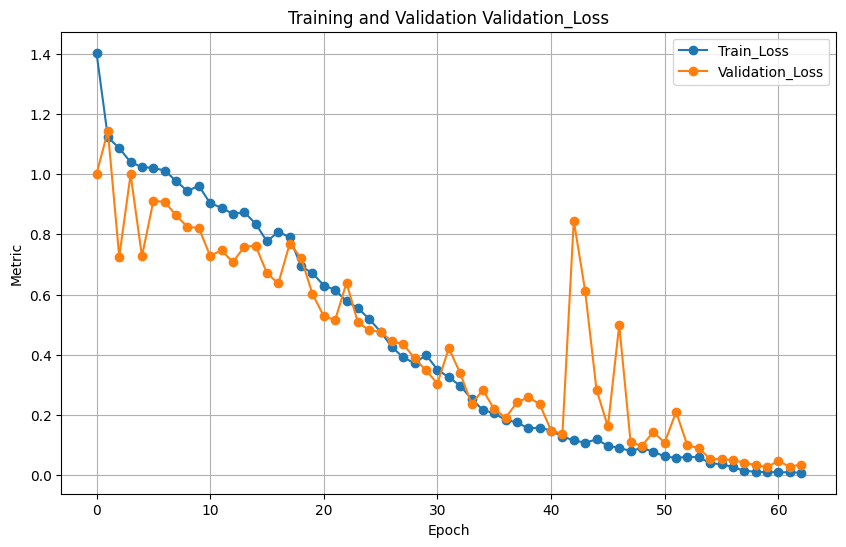

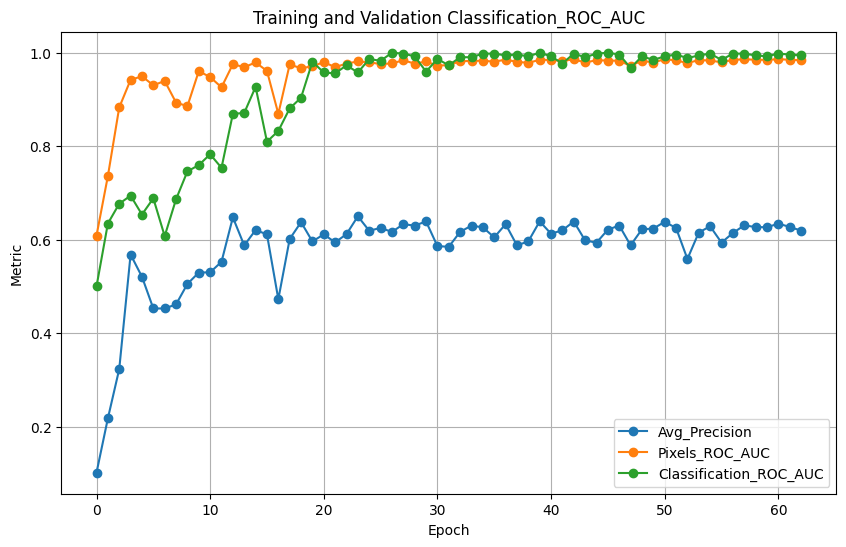

In [ ]:
model = SupersimplenetModel(
        backbone="wide_resnet50_2.tv_in1k",
        layers=["layer2", "layer3"],
        perlin_threshold=0.2,
        stop_grad=True
    )

trained_model = train_ssn_with_validation(
    model=model,
    train_dataset=train_dataset,
    segmentation_dataset=segmentation_val_dataset,
    classification_dataset=classification_val_dataset,
    num_epochs=70,
    learning_rate=1e-4,
    weight_decay=1e-5,
    device=device,
    log_interval=4,
    log_dir=f"../experiments/{class_name}/" + logs_path,
    batch_size=16,
    resume_from_checkpoint=False,
    freeze_extractor=True,
    early_stopping_patience=12,
    early_stopping_metric="Pixels_ROC_AUC",
    early_stopping_mode="max"
)

Подбор гиперпараметров через optuna с Pixel ROC AUC в качестве метрики качества

In [ ]:
# import optuna
# from optuna.samplers import TPESampler
# from optuna.trial import TrialState
# import torch
# import os
# from torch.utils.data import Dataset

# logs_path = "optuna_v3_refine"
# optuna_random_state = 42


# class SegmentationPathDataset(Dataset):
#     def __init__(self, items, img_transform=None, mask_transform=None):
#         self.items = list(items)
#         self.img_transform = img_transform
#         self.mask_transform = mask_transform
#         self.base_transform = transforms.Compose([transforms.ToTensor()])

#     def __len__(self):
#         return len(self.items)

#     def __getitem__(self, idx):
#         image_path, mask_path = self.items[idx]
#         image = Image.open(image_path).convert("RGB")
#         mask = Image.open(mask_path).convert("L")
#         image = self.img_transform(image) if self.img_transform else self.base_transform(image)
#         mask = self.mask_transform(mask) if self.mask_transform else self.base_transform(mask)
#         return image, mask


# class ClassificationPathDataset(Dataset):
#     def __init__(self, items, img_transform=None):
#         self.items = list(items)
#         self.img_transform = img_transform
#         self.base_transform = transforms.Compose([transforms.ToTensor()])

#     def __len__(self):
#         return len(self.items)

#     def __getitem__(self, idx):
#         image_path, label = self.items[idx]
#         image = Image.open(image_path).convert("RGB")
#         image = self.img_transform(image) if self.img_transform else self.base_transform(image)
#         return image, label


# optuna_seg_source = Segmentation_Dataset(
#     dataset_path,
#     class_name,
#     img_transform=None,
#     mask_transform=None,
#     test_classes=test_groups,
# )
# optuna_seg_items = list(zip(optuna_seg_source.images, optuna_seg_source.masks))
# optuna_seg_val_items, _ = train_test_split(
#     optuna_seg_items,
#     test_size=0.5,
#     random_state=optuna_random_state,
#     shuffle=True,
# )

# optuna_cls_source = Classification_Dataset(
#     dataset_path,
#     class_name,
#     img_transform=None,
#     test_classes=test_groups,
# )
# optuna_cls_items = list(zip(optuna_cls_source.images, optuna_cls_source.labels))
# optuna_cls_val_items, _ = train_test_split(
#     optuna_cls_items,
#     stratify=[label for _, label in optuna_cls_items],
#     test_size=0.5,
#     random_state=optuna_random_state,
#     shuffle=True,
# )


# def build_optuna_val_datasets(image_size):
#     segmentation_val_dataset = SegmentationPathDataset(
#         optuna_seg_val_items,
#         img_transform=get_transformer(image_size),
#         mask_transform=get_mask_transformer(image_size),
#     )
#     classification_val_dataset = ClassificationPathDataset(
#         optuna_cls_val_items,
#         img_transform=get_transformer(image_size),
#     )
#     return segmentation_val_dataset, classification_val_dataset


# def read_metrics(metrics_path):
#     metrics = {}
#     with open(metrics_path, "r") as f:
#         for line in f:
#             if ":" not in line:
#                 continue
#             key, val = line.strip().split(":", 1)
#             metrics[key.strip()] = float(val.strip())
#     return metrics


# def objective(trial):
#     os.makedirs("../experiments", exist_ok=True)
#     trial_name = f"trial_{trial.number}"
#     log_dir = os.path.join("../experiments", class_name, logs_path, trial_name)
#     os.makedirs(log_dir, exist_ok=True)

#     backbone = "wide_resnet50_2.tv_in1k"
#     perlin_threshold = trial.suggest_float("perlin_threshold", 0.15, 0.30)
#     lr = trial.suggest_float("learning_rate", 5e-5, 5e-4, log=True)
#     weight_decay = trial.suggest_float("weight_decay", 1e-6, 5e-5, log=True)
#     batch_size = trial.suggest_categorical("batch_size", [8, 16])
#     trained_img_size = trial.suggest_categorical("image_size", [256, 320])

#     train_dataset = Train_Dataset(dataset_path, class_name, transform=get_transformer(trained_img_size))
#     segmentation_val_dataset, classification_val_dataset = build_optuna_val_datasets(trained_img_size)

#     params_path = os.path.join(log_dir, "params.txt")
#     with open(params_path, "w") as f:
#         f.write(f"backbone: {backbone}\n")
#         f.write("layers: ['layer2', 'layer3']\n")
#         f.write("stop_grad: True\n")
#         f.write(f"perlin_threshold: {perlin_threshold}\n")
#         f.write(f"learning_rate: {lr}\n")
#         f.write(f"weight_decay: {weight_decay}\n")
#         f.write(f"batch_size: {batch_size}\n")
#         f.write(f"image_size: {trained_img_size}\n")
#         f.write("num_epochs: 16\n")
#         f.write("early_stopping_patience: 4\n")

#     model = SupersimplenetModel(
#         backbone=backbone,
#         layers=["layer2", "layer3"],
#         perlin_threshold=perlin_threshold,
#         stop_grad=True,
#     )

#     try:
#         train_fastflow_with_validation(
#             model=model,
#             train_dataset=train_dataset,
#             segmentation_dataset=segmentation_val_dataset,
#             classification_dataset=classification_val_dataset,
#             num_epochs=16,
#             learning_rate=lr,
#             weight_decay=weight_decay,
#             device=device,
#             log_interval=4,
#             log_dir=log_dir,
#             batch_size=batch_size,
#             resume_from_checkpoint=False,
#             freeze_extractor=True,
#             early_stopping_patience=4,
#             early_stopping_metric="Pixels_ROC_AUC",
#             early_stopping_mode="max",
#         )
#     except RuntimeError as e:
#         if torch.cuda.is_available():
#             torch.cuda.empty_cache()
#         print(f"Trial {trial.number} failed with error: {e}")
#         raise optuna.TrialPruned()
#     except Exception as e:
#         if torch.cuda.is_available():
#             torch.cuda.empty_cache()
#         print(f"Trial {trial.number} failed with error: {e}")
#         raise optuna.TrialPruned()

#     metrics_path = os.path.join(log_dir, "final_metrics.txt")
#     if not os.path.exists(metrics_path):
#         raise optuna.TrialPruned()

#     metrics = read_metrics(metrics_path)
#     required_metrics = ["Pixels_ROC_AUC", "Classification_ROC_AUC", "Avg_Precision"]
#     for metric_name in required_metrics:
#         if metric_name not in metrics:
#             raise optuna.TrialPruned()

#     pixel_auc = metrics["Pixels_ROC_AUC"]
#     classification_auc = metrics["Classification_ROC_AUC"]
#     avg_precision = metrics["Avg_Precision"]
#     score = 0.60 * pixel_auc + 0.25 * classification_auc + 0.15 * avg_precision

#     trial.set_user_attr("Pixels_ROC_AUC", pixel_auc)
#     trial.set_user_attr("Classification_ROC_AUC", classification_auc)
#     trial.set_user_attr("Avg_Precision", avg_precision)
#     trial.set_user_attr("Validation_Loss", metrics.get("Validation_Loss"))
#     if torch.cuda.is_available():
#         torch.cuda.empty_cache()
#     return score


# def run_optuna_optimization(
#     n_trials=12,
#     study_name="supersimplenet_v3_refine",
#     storage="sqlite:///supersimplenet_opt.db",
# ):
#     study = optuna.create_study(
#         study_name=study_name,
#         direction="maximize",
#         storage=storage,
#         load_if_exists=True,
#         sampler=TPESampler(seed=optuna_random_state),
#     )

#     study.optimize(objective, n_trials=n_trials, n_jobs=1)

#     pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
#     complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

#     print("\nStudy statistics: ")
#     print(f"  Number of finished trials: {len(study.trials)}")
#     print(f"  Number of pruned trials: {len(pruned_trials)}")
#     print(f"  Number of complete trials: {len(complete_trials)}")

#     print("\nBest trial:")
#     trial = study.best_trial
#     print(f"  Value: {trial.value}")
#     print("  Params: ")
#     for key, value in trial.params.items():
#         print(f"    {key}: {value}")
#     print("  Metrics: ")
#     for key, value in trial.user_attrs.items():
#         print(f"    {key}: {value}")
#     print("\n")

#     best_trial_folder = os.path.join("../experiments", class_name, logs_path, "best_trial")
#     os.makedirs(best_trial_folder, exist_ok=True)
#     best_trial_path = os.path.join(best_trial_folder, "best_params.txt")
#     with open(best_trial_path, "w") as f:
#         f.write(f"Value: {trial.value}\n")
#         f.write(f"Trial number: {trial.number}\n")
#         for key, value in trial.params.items():
#             f.write(f"{key}: {value}\n")
#         for key, value in trial.user_attrs.items():
#             f.write(f"{key}: {value}\n")

#     return study


In [60]:
# study = run_optuna_optimization(n_trials=12)

# Тестирование лучшей обученной модели

In [61]:
device="cuda" if torch.cuda.is_available() else "cpu"
print(device)
if torch.cuda.is_available():
    print(f"Название GPU: {torch.cuda.get_device_name(torch.cuda.current_device())}")
else:
    print("CUDA недоступна, обучение будет выполняться на CPU")

cuda
Название GPU: NVIDIA GeForce RTX 3070 Ti Laptop GPU


In [62]:
def predict_with_augmentations(model, img, true_img_size=None):
    """
    Предсказание с усреднением по исходному изображению и его отражениям
    """
    aug_anomaly_maps = []
    
    # Исходное изображение
    with torch.no_grad():
        anomaly_map = torch.sigmoid(model(img).anomaly_map)
        aug_anomaly_maps.append(anomaly_map)
    
    # # Горизонтальное отражение
    # with torch.no_grad():
    #     img_flip_h = torch.flip(img, dims=[-1])
    #     anomaly_map_flip_h = model(img_flip_h).anomaly_map + 1.
    #     # Возвращаем к исходной ориентации
    #     anomaly_map_flip_h = torch.flip(anomaly_map_flip_h, dims=[-1])
    #     aug_anomaly_maps.append(anomaly_map_flip_h)
    
    # # Вертикальное отражение (опционально, если имеет смысл для ваших данных)
    # with torch.no_grad():
    #     img_flip_v = torch.flip(img, dims=[-2])
    #     anomaly_map_flip_v = model(img_flip_v).anomaly_map + 1.
    #     # Возвращаем к исходной ориентации
    #     anomaly_map_flip_v = torch.flip(anomaly_map_flip_v, dims=[-2])
    #     aug_anomaly_maps.append(anomaly_map_flip_v)
    
    # Усреднение аномалийных карт
    avg_anomaly_map = torch.mean(torch.stack(aug_anomaly_maps), dim=0)
    
    if true_img_size is not None:
        avg_anomaly_map = postprocess_anomaly_map(avg_anomaly_map, true_img_size=true_img_size)
    
    return avg_anomaly_map

Segmentation Test:   0%|          | 0/27 [00:00<?, ?it/s]

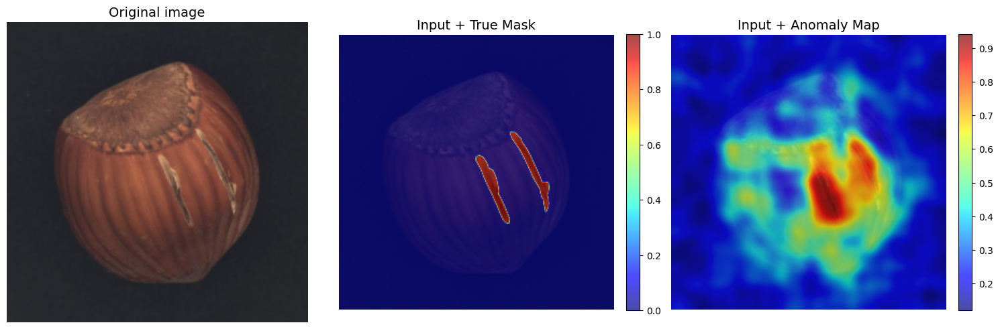

Segmentation Test:  15%|█▍        | 4/27 [00:00<00:02,  9.17it/s]

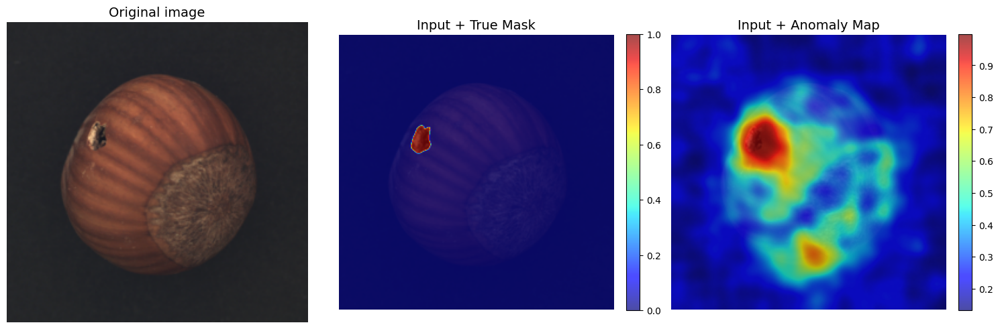

Segmentation Test:  22%|██▏       | 6/27 [00:00<00:03,  6.68it/s]

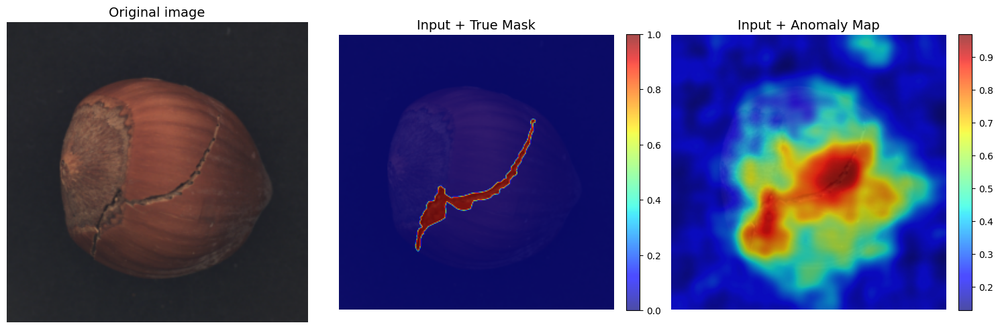

Segmentation Test:  44%|████▍     | 12/27 [00:01<00:02,  7.48it/s]

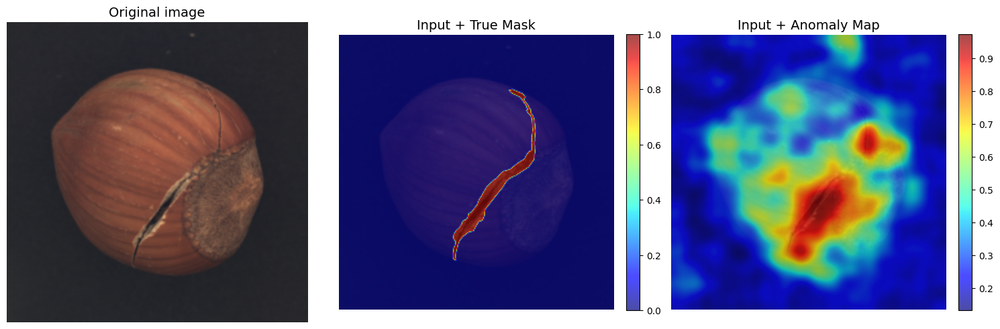

Segmentation Test:  52%|█████▏    | 14/27 [00:02<00:01,  6.51it/s]

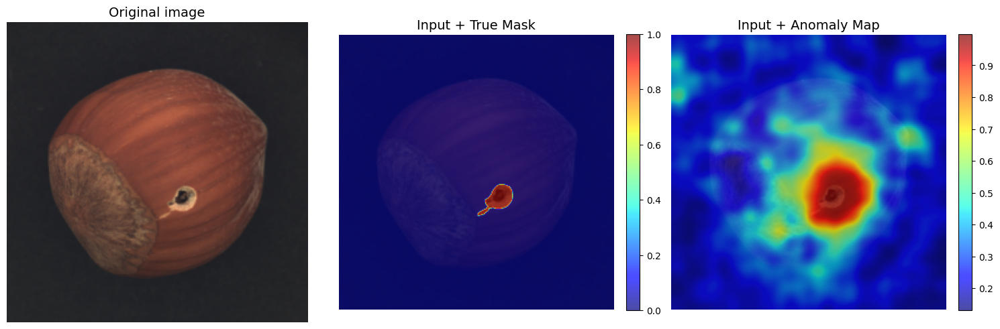

Segmentation Test:  74%|███████▍  | 20/27 [00:02<00:00,  8.82it/s]

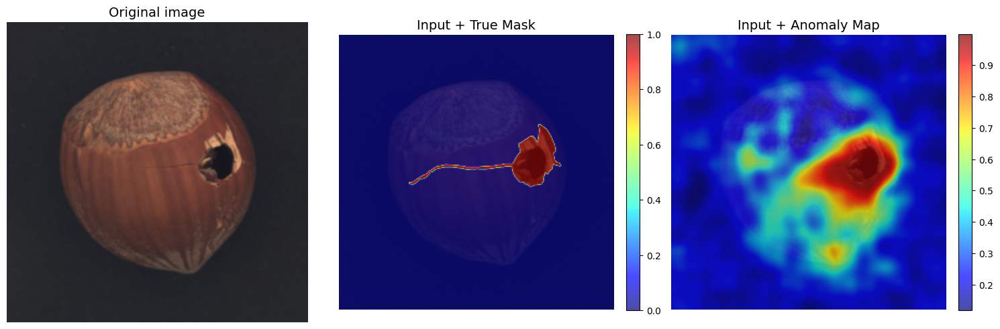

Segmentation Test:  81%|████████▏ | 22/27 [00:03<00:00,  7.26it/s]

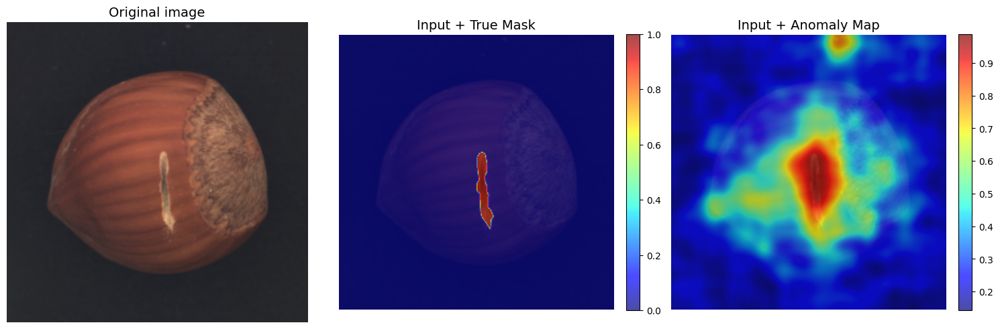

Classification Test:   0%|          | 0/47 [00:00<?, ?it/s]       

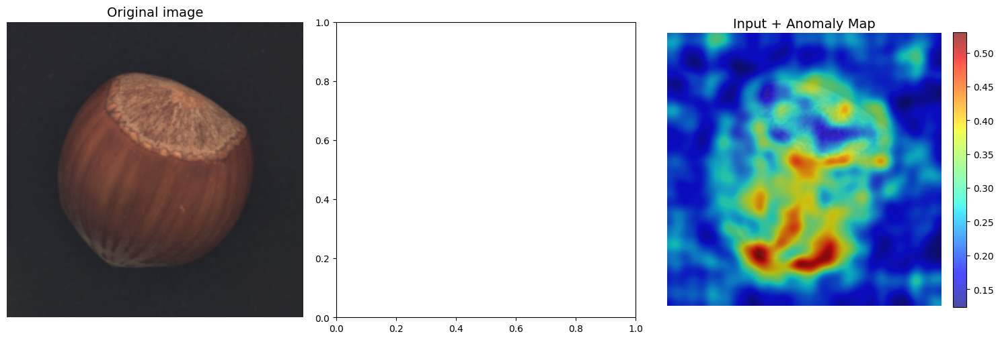

Classification Test:   9%|▊         | 4/47 [00:00<00:03, 11.34it/s]

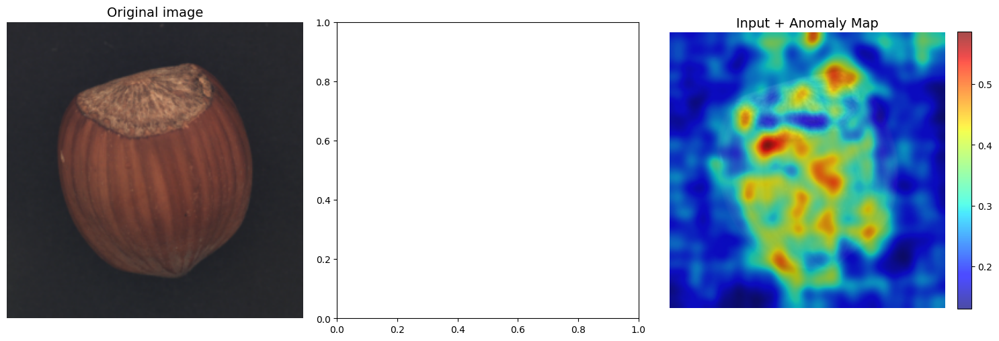

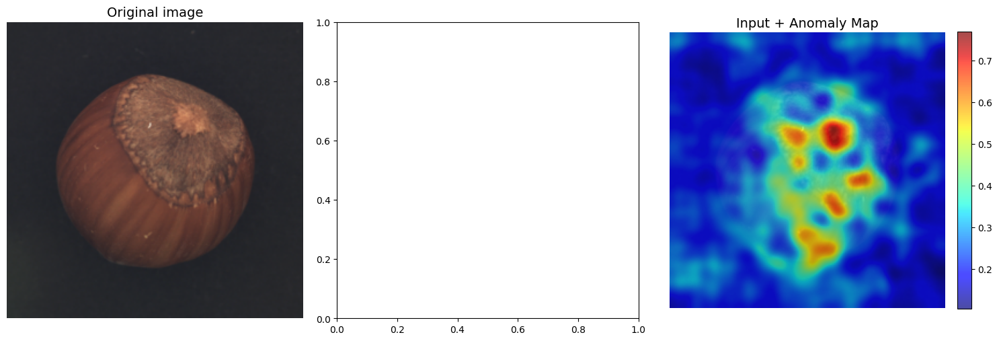

Classification Test:  13%|█▎        | 6/47 [00:00<00:06,  5.98it/s]

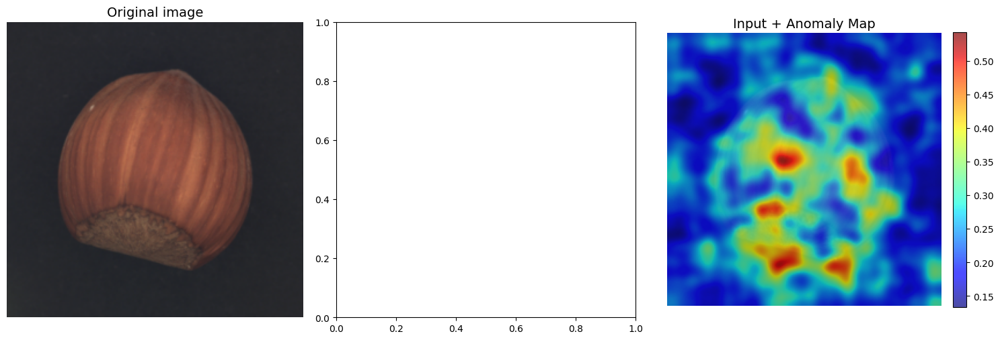

Classification Test:  15%|█▍        | 7/47 [00:01<00:07,  5.12it/s]

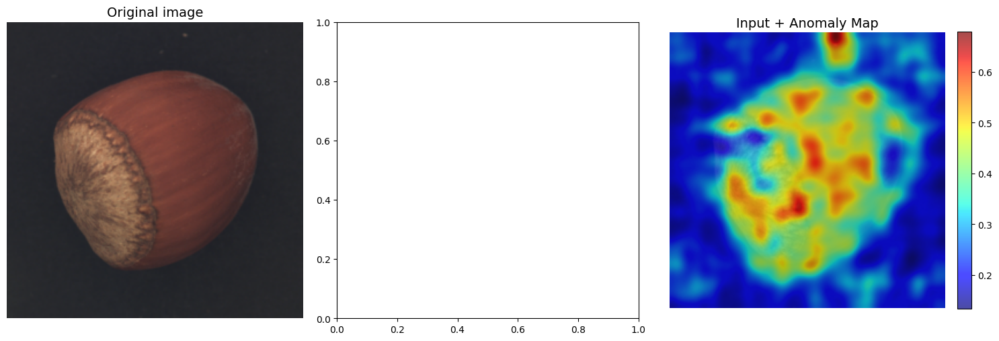

Classification Test:  17%|█▋        | 8/47 [00:01<00:08,  4.64it/s]

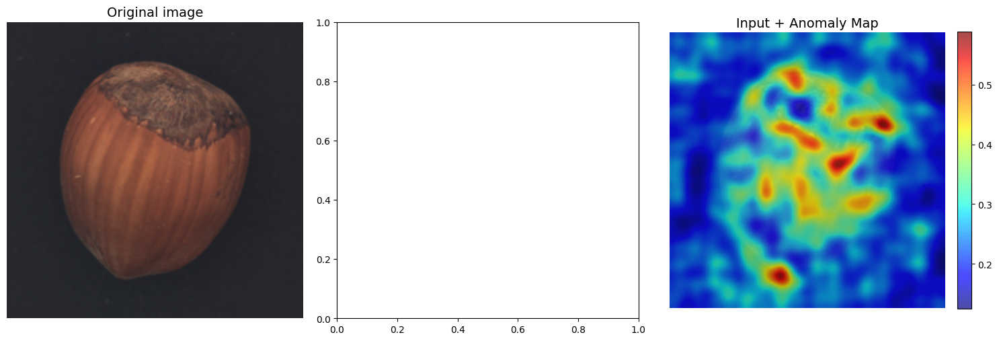

Classification Test:  21%|██▏       | 10/47 [00:01<00:06,  5.32it/s]

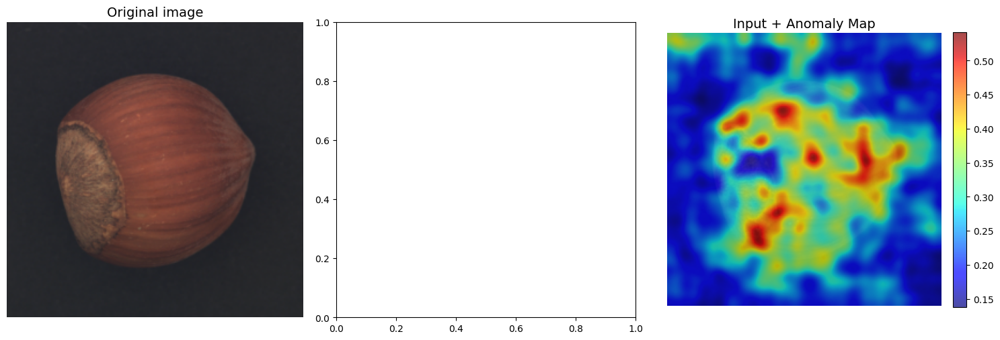

Classification Test:  26%|██▌       | 12/47 [00:02<00:06,  5.72it/s]

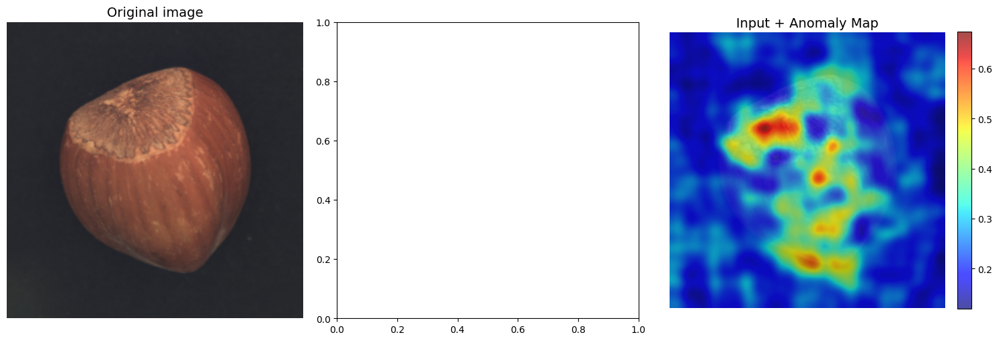

Classification Test:  28%|██▊       | 13/47 [00:02<00:06,  4.98it/s]

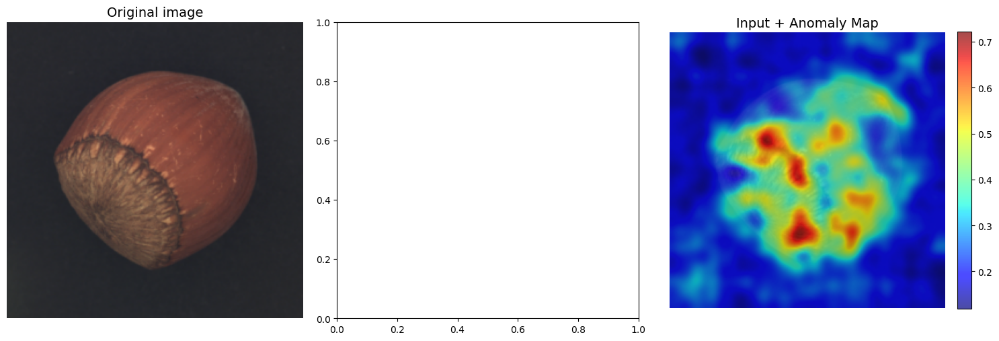

Classification Test:  32%|███▏      | 15/47 [00:02<00:05,  5.35it/s]

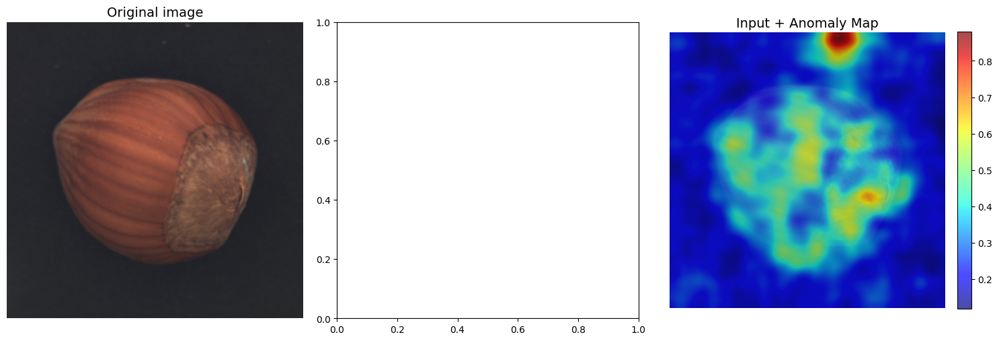

Classification Test:  38%|███▊      | 18/47 [00:03<00:04,  6.27it/s]

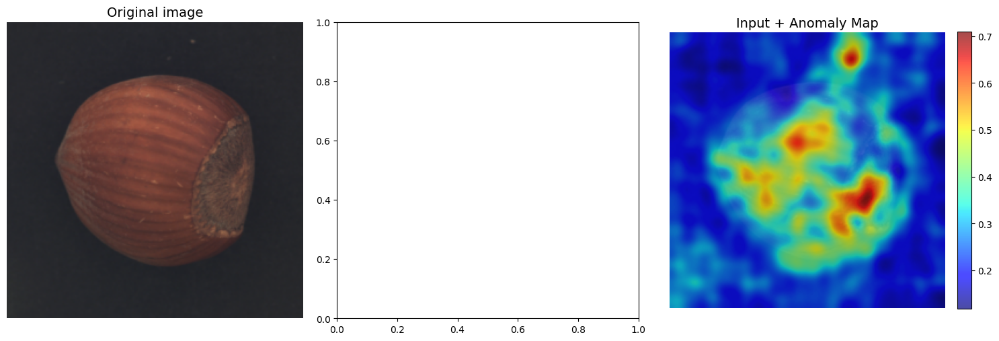

Classification Test:  40%|████      | 19/47 [00:03<00:05,  5.52it/s]

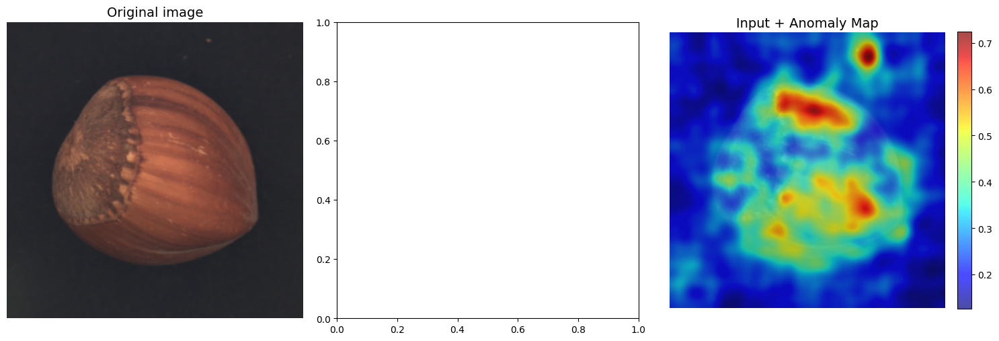

Classification Test:  57%|█████▋    | 27/47 [00:04<00:02,  9.09it/s]

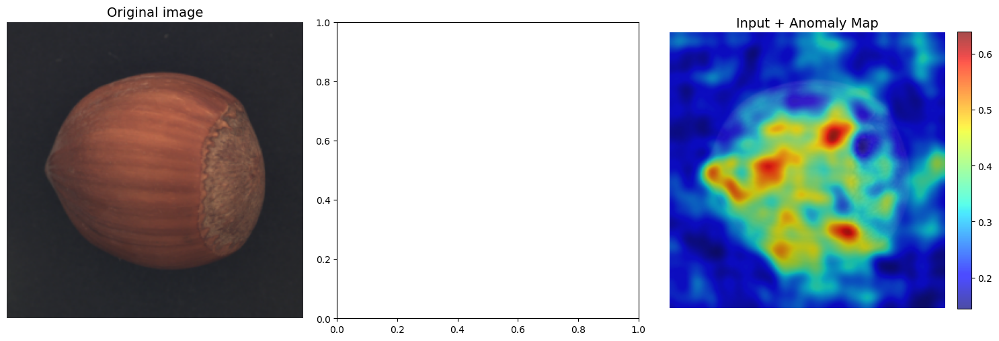

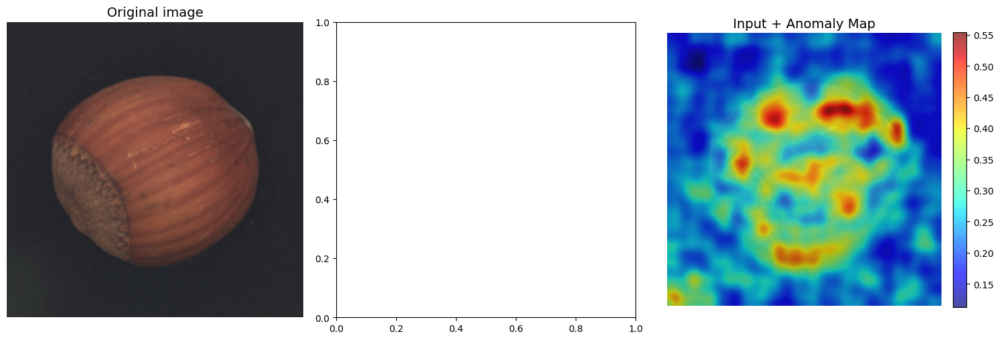

Classification Test:  62%|██████▏   | 29/47 [00:04<00:02,  6.72it/s]

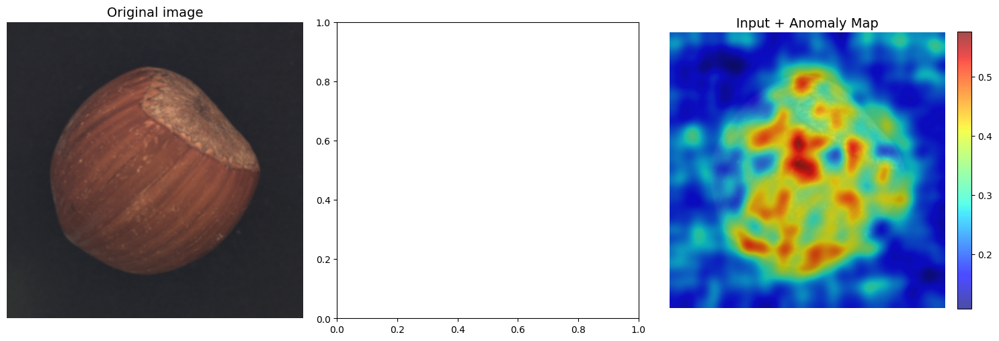

Classification Test:  66%|██████▌   | 31/47 [00:04<00:02,  6.62it/s]

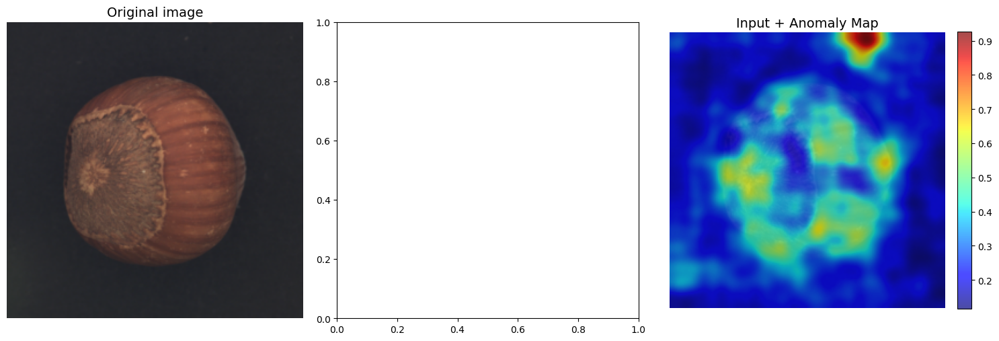

Classification Test:  72%|███████▏  | 34/47 [00:05<00:01,  7.32it/s]

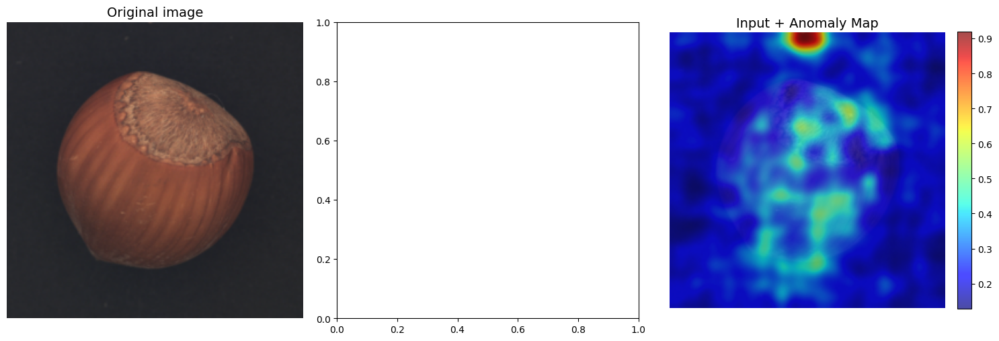

Classification Test:  74%|███████▍  | 35/47 [00:05<00:01,  6.33it/s]

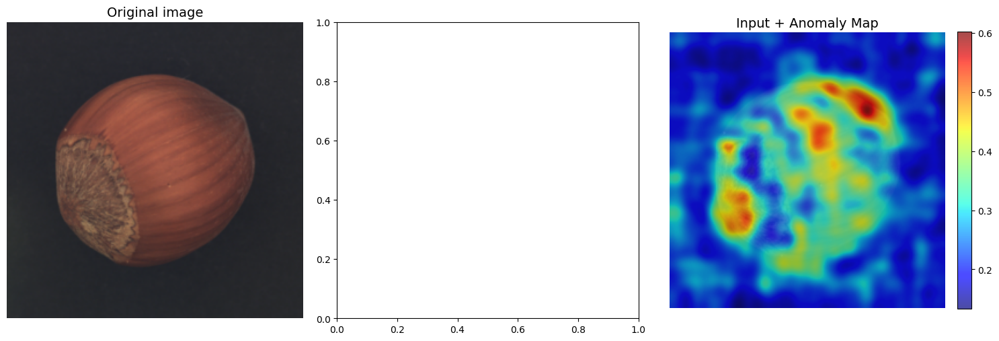

Classification Test:  81%|████████  | 38/47 [00:05<00:01,  7.10it/s]

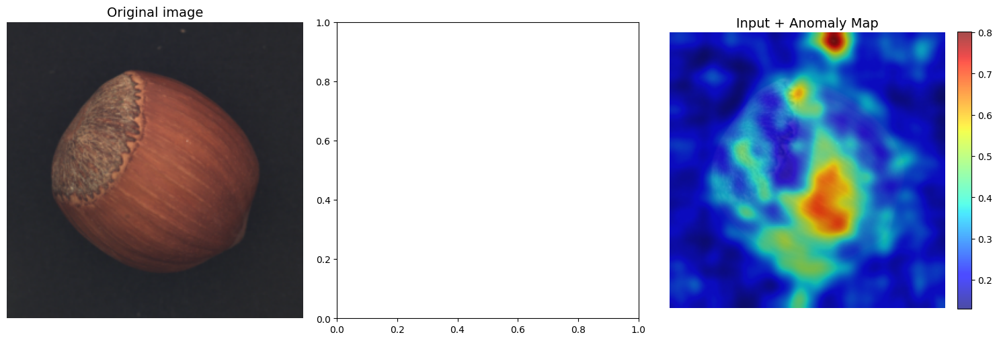

Classification Test:  85%|████████▌ | 40/47 [00:06<00:01,  6.85it/s]

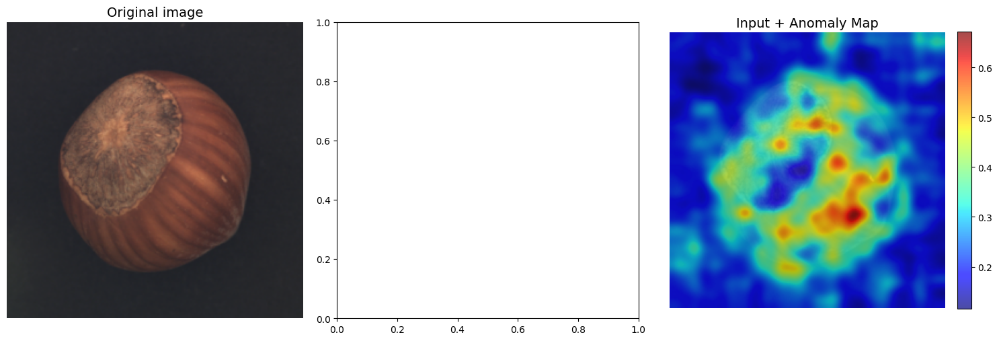

Average pixel precision score: 0.5562443733215332
Average pixel ROC AUC score: 0.977962076663971
Average image ROC AUC score: 0.9888888888888889


In [ ]:
# Загрузка лучшей модели
best_model_path = os.path.join("../experiments", class_name, logs_path, "trained_model.pth")
best_trained_model = torch.load(best_model_path, weights_only=False)
# Замер качества на тестовой выборке
best_trained_model.to(device)
best_trained_model.eval()

# Тест сегментации
precision_scores = []
roc_auc_scores = []
with torch.no_grad():
    for i in tqdm(range(len(segmentation_test_dataset)), desc="Segmentation Test", leave=False):
        img, true_mask = segmentation_test_dataset[i]
        img = img.unsqueeze(0).to(device)
        
        anomaly_map = predict_with_augmentations(best_trained_model, img)
        anomaly_map = postprocess_anomaly_map(anomaly_map, true_img_size=(true_mask.shape[-2], true_mask.shape[-1]))
        
        img_precision = pixel_avg_precision(anomaly_map, true_mask)
        precision_scores.append(img_precision)

        img_roc_auc = pixel_roc_auc(anomaly_map, true_mask)
        roc_auc_scores.append(img_roc_auc)

        if i % 4 == 0:
            visualize_results(img, anomaly_map, true_mask=true_mask)
        


avg_precision_score = torch.tensor(precision_scores).mean().item()
avg_roc_auc_score = torch.tensor(roc_auc_scores).mean().item()

# Тест классификации
predicted_scores = []
true_labels = []
with torch.no_grad():
    for i in tqdm(range(len(classification_test_dataset)), desc="Classification Test", leave=False):
        img, true_label = classification_test_dataset[i]
        img = img.unsqueeze(0).to(device)

        output = best_trained_model(img)
        anomaly_map = torch.sigmoid(output.anomaly_map)
        img_score = output.pred_score.item()

        predicted_scores.append(img_score)
        true_labels.append(true_label)
        if not true_label:
            visualize_results(img, anomaly_map)

cls_score = roc_auc_score(true_labels, predicted_scores)

print(f"Average pixel precision score: {avg_precision_score}")
print(f"Average pixel ROC AUC score: {avg_roc_auc_score}")
print(f"Average image ROC AUC score: {cls_score}")